# Preprocessing: PART II (_MAIN)

**INPUT: _filt.fif files**

1. Fixes the triggers for the _MAIN task
    - Restores missing target onset (20) and go signal (30) triggers from PHOTODIODE CHANNEL
    - Reassign trigger numbers and give them names that make sense 
    - Adds missing start and end triggers for trials

    (see the script for more detailed steps)

2. Marks incomplete trials as bad

**OUTPUT: _filt_clean.fif file**

**Proceed preprocessing using 'fixing_triggers_BL.ipynb' file!**

In [1]:
import mne
import mne.io.fiff
import os
from utils import check_paths
import re
import copy
import numpy as np
import pandas as pd
import pickle

import matplotlib.pyplot as plt
%matplotlib qt

C:\Users\a1902989\AppData\Local\Temp\ipykernel_29412\2831451406.py:8: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


**GROUP ANALYSIS**

ANALYSIS STEPS WITH FUNCTIONS

PHOTODIODE CHANNEL:
Extract triggres for target onset (20) and go signal (30)

In [13]:
# This function converts photodiode responses to events
# INPUT: raw_filt.fif file, photodiode channel name, event id
# OUTPUT: np.array with events

def photo_to_events(raw_filt: mne.io.fiff.raw.Raw, photo_chan: str, event_id: int) -> np.array:
    
    ############# CREATE TRIGGERS WHEN PHOTODIODE EXCEEDS CROSSES THE THRESHOLD #############
    # Get the photodiode channel
    photodiode_channel = raw_filt.copy().pick_channels([photo_chan])

    # Get the data from the photodiode channel
    photodiode_data = photodiode_channel.get_data()[0]  # Get the first (and only) channel data

    # Set a threshold to detect event triggers (you may need to adjust this threshold)
    threshold = np.mean(photodiode_data) + 4 * np.std(photodiode_data)

    # Find indices where the signal crosses the threshold (rising edges)
    photodiode_events = np.where(np.diff(photodiode_data > threshold, prepend=0))[0]

    # Create the events array (event_id can be customized)
    photo_events = np.c_[photodiode_events, np.zeros(len(photodiode_events)), np.full(len(photodiode_events), event_id)].astype(int)
    ####################################################


    ############# FIND MIN TIME DIFFERENCE WHEN PHOTODIODE CROSSES THE THRESHOLD #############
    # Determine min time diff btw start and end of photodiode peak
    time_dists = []
    for i in range(len(photo_events)-1):
        if i%2 == 0:
            time_dist = photo_events[i+1, 0] - photo_events[i, 0]
            time_dists.append(time_dist)

    min_time_diff = min(time_dists)
    ####################################################


    ############# KEEP ONLY THE FIRST PHOTODIODE EVENT IN EACH PAIR #############
    # Set a threshold that determines proximity (based on sampling rate and expected event duration)
    # Initialize an empty list to store the filtered events
    photo_events_filt = []
    step_from_min = 5 # Check in with the data, if that's an appropriate step to use

    # Loop through the events and keep only the start event of each pair
    for i in range(len(photo_events) - 1):
        if i%2 == 0:
            # Compare the current event to the next one
            if photo_events[i + 1, 0] - photo_events[i, 0] > (min_time_diff - step_from_min):
                photo_events_filt.append(photo_events[i])

    # Convert the list back to a NumPy array
    photo_events_filt = np.array(photo_events_filt)
    ####################################################


    return photo_events_filt
    

Merge events from STIM with events from ANNOTATIONS

In [82]:
# This function merger events from PHOTODIODE with events from ANNOTATIONS
# INPUT: raw_filt.fif file, photodiode events
# OUTPUT: tuple with events array and events dictionary

def merge_photo_events(raw_filt: mne.io.fiff.raw.Raw, photo_events: np.array) -> tuple:
    
    ####### Merge two arrays of events #######
    # Read events stored in the raw file
    events_annot = mne.events_from_annotations(raw_filt)

    # Extract the array and dictionary from events_annot
    events_annot_array = events_annot[0]
    events_annot_dict = events_annot[1]

    # Merge the two event arrays using np.vstack and sort the merged events array by the first column (time)
    merged_events = np.vstack((events_annot_array, photo_events))
    merged_events = merged_events[merged_events[:, 0].argsort()]

    # Add '99' to the event dictionary with a label
    events_annot_dict['99'] = 99
    ####################################################


    ####### If there is a trigger near the Photodiode trigger, remove protodiode trigger #######
    # Determine mean time diff btw photodiode peak and preceeding eeg trigger (excluding too long time distances)
    time_dists_photo = []
    long_dist = 50 #! arbitrary - check if it makes sense based on the data 

    for i in range(len(merged_events) - 1):
        if merged_events[i+1, 2] == 99:
            time_dist = merged_events[i+1, 0] - merged_events[i, 0]
            if time_dist < long_dist:
                time_dists_photo.append(time_dist)

    mean_time_diff_photo = np.mean(time_dists_photo)

    # Set a threshold that determines proximity (based on your sampling rate and expected event duration)
    rows_to_filt = []
    step_from_mean = 5 # Check in with the data, if that's an appropriate step to use

    # Loop through the events and keep only the start event of each pair
    for i in range(len(merged_events) - 1):
                if merged_events[i+1, 2] == 99:
                    # Compare the current event to the next one
                    if merged_events[i+1, 0] - merged_events[i, 0] <=  (mean_time_diff_photo + step_from_mean):
                        rows_to_filt.append(i+1)
                    elif merged_events[i, 2] in range(1,8):
                         rows_to_filt.append(i+1)
    # get rid of two similar arrays if there are any (sometimes the case with the impedance check trigger 0) 
    for i in range(len(merged_events) - 1):
        #  if merged_events[i+1][0] == merged_events[i][0]:
        #       rows_to_filt.append(i+1)
        if merged_events[i][2] == merged_events[i+1][2]:
            # print(merged_events[i][2], merged_events[i+1][2])
            # print('two SAME triggers in a row!')
            dist = merged_events[i+1][0] - merged_events[i][0]
            # print(dist)
            if dist < 5:
                print(merged_events[i][2], '- dist too short!')
                rows_to_filt.append(i+1)
         
    # Delete the rows with duplicated events
    merged_events_filt = np.delete(merged_events, rows_to_filt, axis=0)
    ####################################################

    # Create a new tuple with the new dictionary
    events = (merged_events_filt, events_annot_dict)

    return events


Reassign values to the triggers

In [15]:
# This function assing names to the values (triggers) in EVENTS DICT corresponding to keys and replaces old trigger names with new ones in EVENTS ARRAY 
# INPUT: events tuple
# OUTPUT: tuple with renamed events
def rename_events_after_triggers(events: tuple) -> tuple:
    
    new_events = copy.deepcopy(events)
    
    # Assing events the values corresponding to the keys names
    for key, value in new_events[1].items():
        new_value = int(re.search(r'\d+', key).group())
        new_events[1][key] = new_value

    # Create a mapping from the old event values to the new event values
    value_mapping = {events[1][key]: new_events[1][key] for key in events[1] if key in new_events[1]}

    # Replace the values in the third column of the events array
    for old_value, new_value in value_mapping.items():
        new_events[0][:, 2][new_events[0][:, 2] == old_value] = new_value

    return new_events

MAIN TASK - give keys in the dictionary meaningful names

1:	start of practice
2:	start of baseline
3:	start of first rotated block
4:	start of second rotated block
5:	start of post block
6:	start of first deadapt block
7:	start of second deadapt block

8:	trial start
9:	trial end

20:	target onset
30:	go signal onset
40:	reach end

111:	bad trial - moved in response to display of target
112:	bad trial - too slow 	%!!! CHANGED from 222
113:	bad trial - didnt react within 1s 	%!!! CHANGED from 333

In [16]:
# This function assings meaningful names to the keys in EVENTS DICT
# INPUT: events tuple
# OUTPUT: tuple with new EVENTS DICT keys

def make_sense(events: tuple, names_dict: dict) -> tuple:
    
    # Create an inverse mapping of main_dict
    inverse_main_dict = {v: k for k, v in main_dict.items()}

    # Replace keys in new_events with corresponding keys from main_dict
    replaced_keys_dict = {}
    for old_key, value in events[1].items():
        # Look up the corresponding new key using the value
        new_key = inverse_main_dict.get(value, old_key)  # Default to old_key if value not found in main_dict
        replaced_keys_dict[new_key] = value

    # Create a new tuple with the new dictionary
    new_events = (events[0], replaced_keys_dict)
    
    return new_events


Add missing end of trial events

In [38]:
# This function adds end of trial events (9) to BAD trials (111 & 77)
# INPUT: events tuple
# OUTPUT: updated events array

def add_end_to_bad(events: tuple, bad_triggers=[None]) -> np.array:
    
    # SANITY CHECK: min_time should not exceed 10 (see the following cell)
    time_dists = []

    for i in range(len(events[0][:-1, 0])):
        time_dist = events[0][i+1, 0] - events[0][i, 0]
        time_dists.append(time_dist)

    min_time = min(time_dists)
    # print(time_dists)
    print('Min time:', min_time)

    if min_time <= 10:
        raise ValueError('Min_time is less than 10 - adjust the timing for new events!')

    add_events = []

    # Loop through events, find 111 triggers, and add trigger 9
    for event in events[0]:
        if event[2] in bad_triggers.values():  # 111, 112, 113 trigger code
            # Add min distance between 111 and new 9
            add_event_time = event[0] + 10

            # Create a new event with the trigger code 9
            add_event = [add_event_time, 0, events[1]['trial_end']]  # [time, 0, trigger code 9]

            # Append the new event to the list of new events
            add_events.append(add_event)

    # Convert add_events list to a NumPy array
    add_events = np.array(add_events, dtype=int)

    # Combine the original events with the new events
    events_array = np.vstack((events[0], add_events))

    # Sort the modified events by the time column (first column)
    events_array = events_array[np.argsort(events_array[:, 0])]

    return events_array

Introduce start (8) and end (9) of trial triggers if there are none

In [18]:
# This function adds start (8) and end (9) of trial events, if they are missing
# INPUT: events array
# OUTPUT: updated events array

def add_start_and_end(events_array: np.array, events_ids: dict) -> np.array:

    #!!! modified_events -> new_events_array !!!

    ####### Check mean time distance between start (8) and end (9) of trial events #######
    # SANITY CHECK: if mean significantly deviates from 100 - check the data
    to_avg = []
    for i in range(len(events_array) - 1):
        if events_array[i, 2] == 9:
            if events_array[i+1, 2] == 8:
                if events_array[i+1, 0] - events_array[i, 0] < 1000:
                    to_avg.append(events_array[i+1, 0] - events_array[i, 0])

    print('Mean:', np.mean(to_avg))

    if int(np.mean(to_avg)) not in range(90,110):
        raise ValueError('Mean deviates from 100 - check the data!')
    ###########################################################################


    ####### Add missing start (8) and end (9) of trial events #######
    upd_events = []
    for i in range(len(events_array) - 1):

        # if there's no start
        if events_array[i, 2] == 9:
            if events_array[i+1, 2] not in range(9):
                # print(i,'- no start')
                
                # Add mean timing btw end (9) and start (8)
                new_event_time = events_array[i, 0] + int(np.mean(to_avg))

                # Create a new event with the trigger code 8
                new_event = [new_event_time, 0, events_ids['trial_start']]  # [time, 0, trigger code 8]

                # Append the new event to the events_array array
                upd_events.append(new_event)
                # print(new_event)

        # if there's no start after break
        elif events_array[i, 2] in range(1,8):
            if events_array[i+1, 2] != 8:
                # print(i+1,'- no start after break')
                
                # Add mean timing btw end (9) and start (8)
                new_event_time = events_array[i, 0] + int(np.mean(to_avg))

                # Create a new event with the trigger code 8
                new_event = [new_event_time, 0, events_ids['trial_start']]  # [time, 0, trigger code 9]

                # Append the new event to the events_array array
                upd_events.append(new_event)
                # print(new_event)
        
        # if there's no end
        elif events_array[i+1, 2] == 8:
            if events_array[i, 2] not in range(1,10):
                # print(i,'- no end')
                
                # Subtract mean timing btw end (9) and start (8)
                new_event_time = events_array[i+1, 0] - int(np.mean(to_avg))

                # Create a new event with the trigger code 9
                new_event = [new_event_time, 0, events_ids['trial_end']]  # [time, 0, trigger code 9]

                # Append the new event to the events_array array
                upd_events.append(new_event)
                # print(new_event)

        # if there's no end before break
        elif events_array[i+1, 2] in range(2,8):
            if events_array[i, 2] != 9:
                # print(i+1,'- no end before break')
                
                # Subtract mean timing btw end (9) and start (8)
                new_event_time = events_array[i, 0] - int(np.mean(to_avg))

                # Create a new event with the trigger code 9
                new_event = [new_event_time, 0, events_ids['trial_end']]  # [time, 0, trigger code 9]

                # Append the new event to the events_array array
                upd_events.append(new_event)
                # print(new_event)
        
    # if no end for last trial
    if events_array[-1, 2] == 0 and events_array[-2, 2] != 9:
            
            # Subtract mean timing btw end (9) and start (8)
            new_event_time = events_array[-1, 0] - 5

            # Create a new event with the trigger code 9
            new_event = [new_event_time, 0, events_ids['trial_end']]  # [time, 0, trigger code 9]

            # Append the new event to the events_array array
            upd_events.append(new_event)
            # print(new_event)

    # Convert new_events list to a NumPy array
    upd_events = np.array(upd_events, dtype=int)

    # Combine the original events with the new events
    events_array = np.vstack((events_array, upd_events))

    # Sort the modified events by the time column (first column)
    events_array = events_array[np.argsort(events_array[:, 0])]
                
    return events_array

Rename the 99 triggers to 20 or 30

In [19]:
# This function converts photodiode events (99) to either target_on (20) or go signal (30)
# INPUT: events array
# OUTPUT: None or ValueError if events counts don't match

def get_target_and_go_from_photo(events_array: np.array, events_ids: dict) -> tuple:

    # Initialize an empty list to store the filtered events
    rows_to_filt = []

    # replace 99 with 20 and 30 and filter 99 triggerch that do not match the pattern
    for i in range(len(events_array) - 1):

        if events_array[i, 2] == 99:
            if events_array[i-1, 2] == 8:
                if events_array[i+1, 2] == 9:
                    rows_to_filt.append(i)
                elif events_array[i+1, 2] == 30 or events_array[i+1, 2] == 99:
                    events_array[i, 2] = 20
            elif events_array[i-1, 2] == 20 and events_array[i+1, 2] == 40:
                events_array[i, 2] = 30
            else:
                rows_to_filt.append(i)
    print(rows_to_filt)
    print('LENGTH:', len(rows_to_filt))

    for i in range(1, len(events_array) - 1):
        if events_array[i, 2] == 99:
            if events_array[i-1, 2] == 8 and events_array[i+1, 2] == 9:
                rows_to_filt.append(i-1)
                rows_to_filt.append(i+1)
    print(rows_to_filt)
    print('LENGTH:', len(rows_to_filt))

    # Sort and remove duplicates
    rows_to_filt = sorted(set(rows_to_filt))
    print(rows_to_filt)

    # delete 99 rows from events array and 'photodiode' value from events dict
    events_array_filt = np.delete(events_array, rows_to_filt, axis=0)
    events_ids.pop("photodiode")

    # save final version of events tuple
    events_final_to_save = (events_array_filt, events_ids)
    
    return events_final_to_save

CHECK EVENTS COUNTS

In [20]:
# This function counts number of events and checks if they match
# INPUT: events array
# OUTPUT: None or ValueError if events counts don't match

def check_events_counts(events_array: np.array) -> None:

    # Convert the column with trigger names to a pandas Series and get value counts
    value_counts = pd.Series(events_array[:,2]).value_counts()

    # Get counts for specific numbers (if they exist, otherwise return 0)
    count_8 = value_counts.get(8, 0) # start of trial
    count_9 = value_counts.get(9, 0) # end of trial
    count_111 = value_counts.get(111, 0) # bad early
    count_77 = value_counts.get(77, 0) # bad late

    # Check if num of 8 equals num of 9
    if count_8 != count_9:
        raise ValueError(f"Count of 8 = {count_8} does not equal count of 9 = {count_9} !")

    print(f'Total number of trials: {count_8}')

    # Check if num of 111 + num of 77 equals num of 8
    if count_8 - (count_111 + count_77) != 520:
        raise Warning(f"Count of 8 - (111 + 77) = {count_8 - (count_111 + count_77)} does not equal 520 !")

    print("ALL GOOD: Events counts match!")


Marking the trials that do not contain [8 20 30 40 9] pattern as BAD

In [21]:
# This function annotates trials that do not match the pattern [8, 20, 30, 40, 9]
# INPUT: raw_filt fif file, events array
# OUTPUT: annotated raw_filt fif file

def annotate_bad_trials(raw_filt: mne.io.fiff.raw.Raw, events_array: np.array) -> mne.io.fiff.raw.Raw:

    # The correct trigger sequence for a normal trial
    correct_sequence = [8, 20, 30, 40, 9]

    # Get the sampling frequency from the raw EEG data
    sfreq = raw_filt.info['sfreq']

    # Find indices of all trial starts (trigger 8)
    trial_start_indices = np.where(events_array[:, 2] == 8)[0]

    # List to store annotations for bad segments
    bad_segs = []

    # Iterate through each trial start index
    for start_idx in trial_start_indices:
        # Find the index of the corresponding '9' trigger (trial_end)
        trial_end_idx = np.where(events_array[start_idx:, 2] == 9)[0]
        
        if len(trial_end_idx) > 0:  # Make sure '9' trigger exists after '8'
            trial_end_idx = trial_end_idx[0] + start_idx  # Adjust relative to start_idx
            
            # Extract the potential trigger sequence starting from this trial start
            trigger_sequence = events_array[start_idx:trial_end_idx+1, 2]  # Include '9' in the sequence
            
            # Check if the extracted sequence matches the correct sequence
            if not np.array_equal(trigger_sequence, correct_sequence):
                # Mark this segment as bad from trigger 8 to trigger 9
                start_time = events_array[start_idx, 0] / sfreq  # Convert sample point to time (in seconds)
                end_time = events_array[trial_end_idx, 0] / sfreq  # Time of trigger 9
                
                # Append the bad segment as an annotation
                bad_segs.append((start_time, end_time - start_time, 'bad'))

    # Add an annotation for everything before the first trigger '2' (baseline)
    baseline_idx = np.where(events_array[:, 2] == 2)[0]  # Find the index of trigger 2
    if len(baseline_idx) > 0:
        first_baseline_idx = baseline_idx[0]
        first_baseline_time = events_array[first_baseline_idx, 0] / sfreq  # Time of the first trigger 2
        
        # Mark from the start of the recording (time 0) to the time of the first trigger 2
        bad_segs.append((0, first_baseline_time, 'bad'))
    else:
        ValueError(f'{sub_name}: No trigger for Baseline block!')

    # Convert bad_segs list to MNE's Annotations format
    onsets, durations, descriptions = zip(*bad_segs)
    bad_annotations = mne.Annotations(onset=onsets, duration=durations, description=descriptions)

    # Add the new annotations to the raw data
    raw_filt.set_annotations(bad_annotations)

    return raw_filt

_________________________

ANALYSIS START

In [22]:
# MAIN dictionary with events

main_dict = {'0, Impedance': 0,
            'bad_early': 111,
            'bad_late': 77,
            'prac': 1,
            'baseline': 2,
            'target_on': 20,
            'adapt1': 3,
            'go_on': 30,
            'adapt2': 4,
            'reach_end': 40,
            'postadapt': 5,
            'deadapt1': 6,
            'deadapt2': 7,
            'trial_start': 8,
            'trial_end': 9,
            'photodiode': 99}

bad_triggers = {key: value for key, value in main_dict.items() if 'bad_' in key}

In [115]:
# Define the source directory and the destination directory
eeg_data_dir = 'D:\\BonoKat\\research project\\# study 1\\eeg_data\\set'
group = 'Y' # Y or G
subs_dir = os.path.join(eeg_data_dir, group)
task = '_MAIN' # '_BL' or '_MAIN'

for sub_name in ['s1_pac_sub01']: # os.listdir(subs_dir) OR ['s1_pac_sub00']

    filt_dir = os.path.join(subs_dir, sub_name, 'preproc', 'filt')
    eeg_data_path = os.path.join(filt_dir, f'{sub_name}{task}_filt.fif')
    raw_filt = mne.io.read_raw_fif(eeg_data_path, preload=True)

    print(f'{sub_name}: PROCESSING TRIGGERS...')

    photo_events_filt = photo_to_events(raw_filt, photo_chan='BIP3', event_id=99) # This function converts photodiode responses to events
    events = merge_photo_events(raw_filt, photo_events_filt) # This function merger events from PHOTODIODE with events from ANNOTATIONS
    new_events = rename_events_after_triggers(events) # This function assing names to the values (triggers) in EVENTS DICT corresponding to keys
                                                      # and replaces old trigger names with new ones in EVENTS ARRAY 


    new_events = make_sense(new_events, main_dict) # This function assings meaningful names to the keys in EVENTS DICT

    new_events_array = add_end_to_bad(new_events, bad_triggers) # This function adds end of trial events (9) to BAD trials (111 & 77)
    upd_events_array = add_start_and_end(new_events_array, new_events[1]) # This function adds start (8) and end (9) of trial events, if they are missing
    events_final_to_save = get_target_and_go_from_photo(upd_events_array, new_events[1]) # This function converts photodiode events (99) to either target_on (20) or go signal (30)

    # Check if number of events match
    try:
        check_events_counts(events_final_to_save[0]) # This function counts number of events and checks if they match
    except ValueError as e:
        print(f"Error: {e}")
    except Warning as w:
        print(f"Warning: {w}")


    # Save events tuple as a pickle file
    with open(os.path.join(filt_dir, f'{sub_name}{task}_events.pkl'), 'wb') as pickle_file:
        pickle.dump(events_final_to_save, pickle_file)
    print(f"{sub_name}: Events SAVED successfully!")

    raw_filt = annotate_bad_trials(raw_filt, events_final_to_save[0]) # This function annotates trials that do not match the pattern [8, 20, 30, 40, 9]

    #! Check the raw data that contains annotations for bad segments
    # raw_filt.plot(events=events_final_to_save[0])
    
    # save annotated file
    raw_filt.save(os.path.join(filt_dir, f'{sub_name}{task}_filt_events.fif'), overwrite=True)
    print(f'{sub_name}: Processing finished successfully - triggers recovered and bad trials marked!')

Opening raw data file D:\BonoKat\research project\# study 1\eeg_data\set\Y\s1_pac_sub01\preproc\filt\s1_pac_sub01_MAIN_filt.fif...


C:\Users\a1902989\AppData\Local\Temp\ipykernel_29412\1873777372.py:11: RuntimeWarning: This filename (D:\BonoKat\research project\# study 1\eeg_data\set\Y\s1_pac_sub01\preproc\filt\s1_pac_sub01_MAIN_filt.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw_filt = mne.io.read_raw_fif(eeg_data_path, preload=True)


    Read a total of 1 projection items:
        Average EEG reference (1 x 60)  idle
    Range : 0 ... 1575850 =      0.000 ...  3151.700 secs
Ready.
Reading 0 ... 1575850  =      0.000 ...  3151.700 secs...
s1_pac_sub01: PROCESSING TRIGGERS...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Removing projector <Projection | Average EEG reference, active : False, n_channels : 60>
Used Annotations descriptions: ['0, Impedance', '1', '111', '2', '20', '3', '30', '4', '40', '5', '6', '7', '8', '9']
99 - dist too short!
Min time: 50
Mean: 100.1920792079208
[]
LENGTH: 0
[]
LENGTH: 0
[]
Total number of trials: 545
ALL GOOD: Events counts match!
s1_pac_sub01: Events SAVED successfully!
Overwriting existing file.
Writing D:\BonoKat\research project\# study 1\eeg_data\set\Y\s1_pac_sub01\preproc\filt\s1_pac_sub01_MAIN_filt_events.fif


C:\Users\a1902989\AppData\Local\Temp\ipykernel_29412\1873777372.py:47: RuntimeWarning: This filename (D:\BonoKat\research project\# study 1\eeg_data\set\Y\s1_pac_sub01\preproc\filt\s1_pac_sub01_MAIN_filt_events.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw_filt.save(os.path.join(filt_dir, f'{sub_name}{task}_filt_events.fif'), overwrite=True)


Closing D:\BonoKat\research project\# study 1\eeg_data\set\Y\s1_pac_sub01\preproc\filt\s1_pac_sub01_MAIN_filt_events.fif
[done]
s1_pac_sub01: Processing finished successfully - triggers recovered and bad trials marked!


____________

SANITY CHECKS

In [105]:
pd.Series(events_final_to_save[0][:, 2]).value_counts()

8      543
20     543
9      543
30     493
40     477
111     50
77      11
0        2
1        2
2        1
3        1
4        1
5        1
99       1
6        1
7        1
Name: count, dtype: int64

In [77]:
for i in events_final_to_save[0]:
    print(i)

[0 0 0]
[18142     0     1]
[18395     0     8]
[19613     0    20]
[19962     0   111]
[19972     0     9]
[21063     0     8]
[22438     0    20]
[23088     0    30]
[23712     0    40]
[23872     0     9]
[23973     0     8]
[28496     0    20]
[29429     0    30]
[29721     0    40]
[29880     0     9]
[29980     0     8]
[33646     0    20]
[33880     0    30]
[34071     0    40]
[34230     0     9]
[34331     0     8]
[41204     0    20]
[41521     0   111]
[41531     0     9]
[42621     0     8]
[46346     0    20]
[46896     0    30]
[47438     0    40]
[47597     0     9]
[47697     0     8]
[50104     0    20]
[50579     0   111]
[50589     0     9]
[51680     0     8]
[53321     0    20]
[53738     0    30]
[54171     0    40]
[54330     0     9]
[54430     0     8]
[55787     0    20]
[56538     0    30]
[57062     0    77]
[57072     0     9]
[58163     0     8]
[60896     0    20]
[61271     0    30]
[61630     0    40]
[61788     0     9]
[61888     0     8]
[63679     0

In [145]:
for i in range(len(events_final_to_save[0]) - 1):
    if events_final_to_save[0][i+1][2] == 9 and events_final_to_save[0][i][2] == 8:
        print(events_final_to_save[0][i], 'something is wrong...')

[1251784       0       8] something is wrong...


________________________________________________________

**DIRTY FIELD: Single subj preproc - draft**

In [6]:
# set EEG data path, group, task and subject
eeg_data_dir = 'D:\\BonoKat\\research project\\# study 1\\eeg_data\\set'
group = 'Y'
sub_name = 's1_pac_sub01'
task = '_MAIN' # '_RS_OE', '_RS_CE', '_BL', '_MAIN'
filt_dir = os.path.join(eeg_data_dir, group, sub_name, 'preproc', 'filt')
eeg_data_path = os.path.join(filt_dir, f'{sub_name}{task}_filt.fif')
eeg_data_path

'D:\\BonoKat\\research project\\# study 1\\eeg_data\\set\\Y\\s1_pac_sub01\\preproc\\filt\\s1_pac_sub01_MAIN_filt.fif'

Opening raw data file D:\BonoKat\research project\# study 1\eeg_data\set\Y\s1_pac_sub01\preproc\filt\s1_pac_sub01_BL_filt.fif...


C:\Users\a1902989\AppData\Local\Temp\ipykernel_13960\2066366693.py:2: RuntimeWarning: This filename (D:\BonoKat\research project\# study 1\eeg_data\set\Y\s1_pac_sub01\preproc\filt\s1_pac_sub01_BL_filt.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw_bl = mne.io.read_raw_fif(bl_data_path, preload=True)


    Read a total of 1 projection items:
        Average EEG reference (1 x 60)  idle
    Range : 0 ... 151453 =      0.000 ...   302.906 secs
Ready.
Reading 0 ... 151453  =      0.000 ...   302.906 secs...


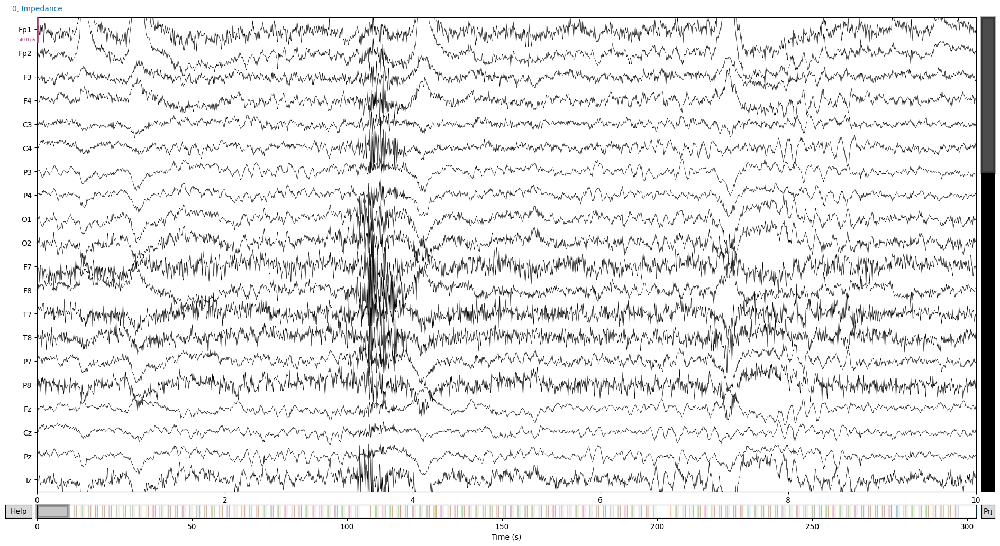

In [10]:
# bl_data_path = os.path.join(filt_dir, f'{sub_name}_BL_filt.fif')
# raw_bl = mne.io.read_raw_fif(bl_data_path, preload=True)
# raw_bl.plot()

In [7]:
raw_filt = mne.io.read_raw_fif(eeg_data_path, preload=True)
raw_filt

Opening raw data file D:\BonoKat\research project\# study 1\eeg_data\set\Y\s1_pac_sub01\preproc\filt\s1_pac_sub01_MAIN_filt.fif...
    Read a total of 1 projection items:
        Average EEG reference (1 x 60)  idle
    Range : 0 ... 1575850 =      0.000 ...  3151.700 secs
Ready.
Reading 0 ... 1575850  =      0.000 ...  3151.700 secs...


C:\Users\a1902989\AppData\Local\Temp\ipykernel_13960\844640183.py:1: RuntimeWarning: This filename (D:\BonoKat\research project\# study 1\eeg_data\set\Y\s1_pac_sub01\preproc\filt\s1_pac_sub01_MAIN_filt.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw_filt = mne.io.read_raw_fif(eeg_data_path, preload=True)


Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,63 points
Good channels,"60 EEG, 1 Stimulus"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,500.00 Hz
Highpass,0.50 Hz
Lowpass,80.00 Hz


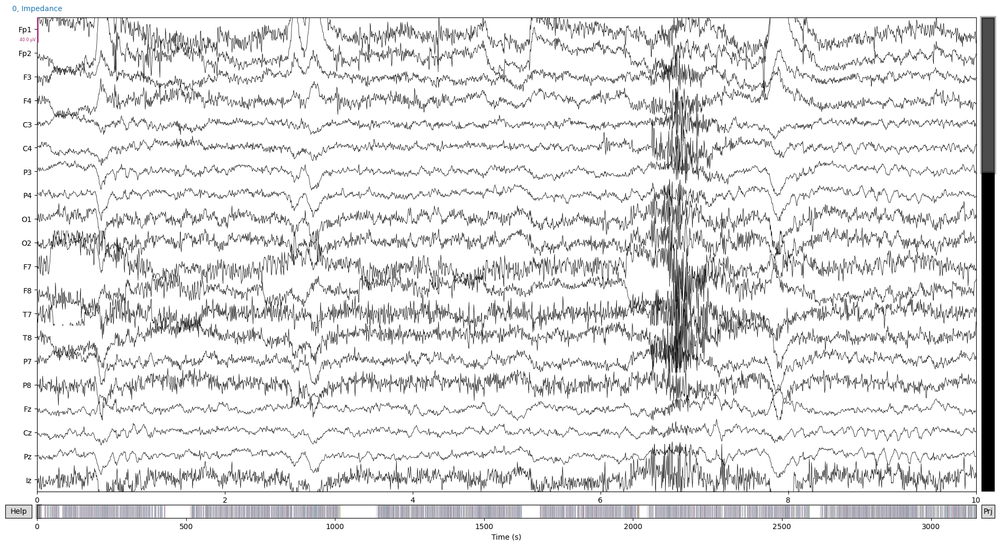

In [9]:
raw_filt.plot()

**EVENTS**

PHOTODIODE CHANNEL:
Extract triggres for target onset (20) and go signal (30)

In [ ]:
print(f'{sub_name}: PROCESSING TRIGGERS...')

In [ ]:
# This function converts photodiode responses to events
# INPUT: raw_filt.fif file, photodiode channel name, event id
# OUTPUT: np.array with events

def photo_to_events(raw_filt: mne.io.fiff.raw.Raw, photo_chan: str, event_id: int) -> np.array:
    

    ############# CREATE TRIGGERS WHEN PHOTODIODE EXCEEDS CROSSES THE THRESHOLD #############
    # Get the photodiode channel
    photodiode_channel = raw_filt.copy().pick_channels([photo_chan])

    # Get the data from the photodiode channel
    photodiode_data = photodiode_channel.get_data()[0]  # Get the first (and only) channel data

    # Set a threshold to detect event triggers (you may need to adjust this threshold)
    threshold = np.mean(photodiode_data) + 4 * np.std(photodiode_data)

    # Find indices where the signal crosses the threshold (rising edges)
    photodiode_events = np.where(np.diff(photodiode_data > threshold, prepend=0))[0]

    # Create the events array (event_id can be customized)
    photo_events = np.c_[photodiode_events, np.zeros(len(photodiode_events)), np.full(len(photodiode_events), event_id)].astype(int)
    ####################################################


    ############# FIND MIN TIME DIFFERENCE WHEN PHOTODIODE CROSSES THE THRESHOLD #############
    # Determine min time diff btw start and end of photodiode peak
    time_dists = []
    for i in range(len(photo_events)-1):
        if i%2 == 0:
            time_dist = photo_events[i+1, 0] - photo_events[i, 0]
            time_dists.append(time_dist)

    min_time_diff = min(time_dists)
    ####################################################


    ############# KEEP ONLY THE FIRST PHOTODIODE EVENT IN EACH PAIR #############
    # Set a threshold that determines proximity (based on sampling rate and expected event duration)
    # Initialize an empty list to store the filtered events
    photo_events_filt = []
    step_from_min = 5 # Check in with the data, if that's an appropriate step to use

    # Loop through the events and keep only the start event of each pair
    for i in range(len(photo_events) - 1):
        if i%2 == 0:
            # Compare the current event to the next one
            if photo_events[i + 1, 0] - photo_events[i, 0] > (min_time_diff - step_from_min):
                photo_events_filt.append(photo_events[i])

    # Convert the list back to a NumPy array
    photo_events_filt = np.array(photo_events_filt)
    ####################################################


    return photo_events_filt
    

In [ ]:
photo_events_filt = photo_to_events(raw_filt, photo_chan='BIP3', event_id=99)

In [117]:
# Get the photodiode channel (replace 'Photodiode' with the correct name)
photodiode_channel = raw_filt.copy().pick_channels(['BIP3'])

# Get the data from the photodiode channel
photodiode_data = photodiode_channel.get_data()[0]  # Get the first (and only) channel data

# Set a threshold to detect event triggers (you may need to adjust this threshold)
threshold = np.mean(photodiode_data) + 4 * np.std(photodiode_data)

# Find indices where the signal crosses the threshold (rising edges)
photodiode_events = np.where(np.diff(photodiode_data > threshold, prepend=0))[0]

# Create the events array (event_id can be customized)
event_id = 99
events_stim = np.c_[photodiode_events, np.zeros(len(photodiode_events)), np.full(len(photodiode_events), event_id)].astype(int)

events_stim


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Removing projector <Projection | Average EEG reference, active : False, n_channels : 60>


array([[  15853,       0,      99],
       [  15880,       0,      99],
       [  33670,       0,      99],
       ...,
       [1608220,       0,      99],
       [1608385,       0,      99],
       [1608395,       0,      99]])

In [118]:
# Determine min time diff btw start and end of photodiode peak

time_dists = []
for i in range(len(events_stim)-1):
    if i%2 == 0:
        time_dist = events_stim[i+1, 0] - events_stim[i, 0]
        time_dists.append(time_dist)

min_time_diff = min(time_dists)
print(min_time_diff)


27
10
11
11
10
10
11
10
11
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
11
11
10
11
10
10
10
10
10
10
10
11
10
10
11
10
11
10
10
10
10
10
10
11
10
10
10
10
10
10
10
10
10
10
10
10
10
10
11
10
10
10
10
9
10
10
10
10
10
10
11
10
10
10
10
10
10
10
10
10
11
10
9
10
10
11
10
11
11
11
9
10
10
11
10
10
11
10
10
10
10
10
10
9
10
10
11
10
10
10
10
10
10
10
10
10
11
11
10
10
10
10
10
10
10
10
10
10
10
10
10
11
10
10
10
10
10
10
10
11
10
10
10
10
10
10
10
10
10
10
10
11
11
10
10
10
10
10
10
10
10
9
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
9
10
10
10
10
10
10
10
9
10
10
10
10
10
10
10
10
10
10
10
10
11
10
10
10
10
10
10
10
10
10
9
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
9
10
10
9
10
10
10
10
10
10
10
9
9
10
10
11
10
10
10
10
10
10
9
10
10
10
10

In [119]:
# Set a threshold that determines proximity (based on sampling rate and expected event duration)
# Initialize an empty list to store the filtered events
events_stim_filt = []
step_from_min = 5 # Check in with the data, if that's an appropriate step to use

# Loop through the events and keep only the start event of each pair
for i in range(len(events_stim) - 1):
    if i%2 == 0:
        # Compare the current event to the next one
        if events_stim[i + 1, 0] - events_stim[i, 0] > (min_time_diff - step_from_min):
            events_stim_filt.append(events_stim[i])

# Convert the list back to a NumPy array
events_stim_filt = np.array(events_stim_filt)

len(events_stim_filt)
print(events_stim_filt)

[[  15853       0      99]
 [  33670       0      99]
 [  36436       0      99]
 ...
 [1606226       0      99]
 [1608210       0      99]
 [1608385       0      99]]


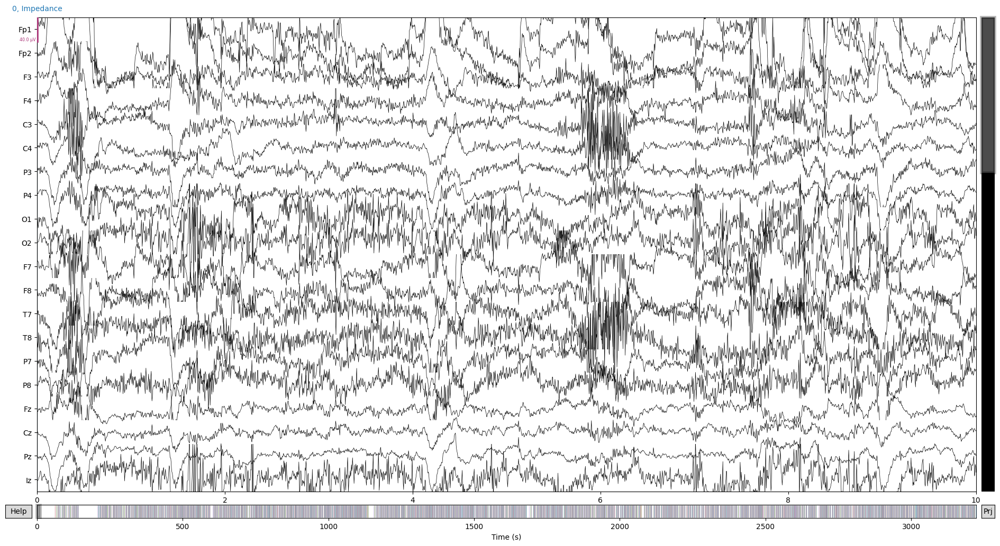

In [120]:
raw_filt.plot(events=events_stim_filt)

Merge events from STIM with events from ANNOTATIONS

In [ ]:
# This function merger events from PHOTODIODE with events from ANNOTATIONS
# INPUT: raw_filt.fif file, photodiode events
# OUTPUT: tuple with events array and events dictionary

def merge_photo_events(raw_filt: mne.io.fiff.raw.Raw, photo_events: np.array) -> tuple:
    
    ####### Merge two arrays of events #######
    # Read events stored in the raw file
    events_annot = mne.events_from_annotations(raw_filt)

    # Extract the array and dictionary from events_annot
    events_annot_array = events_annot[0]
    events_annot_dict = events_annot[1]

    # Merge the two event arrays using np.vstack and sort the merged events array by the first column (time)
    merged_events = np.vstack((events_annot_array, photo_events))
    merged_events = merged_events[merged_events[:, 0].argsort()]

    # Add '99' to the event dictionary with a label
    events_annot_dict['99'] = 99
    ####################################################


    ####### If there is a trigger near the Photodiode trigger, remove protodiode trigger #######
    # Determine mean time diff btw photodiode peak and preceeding eeg trigger (excluding too long time distances)
    time_dists_photo = []
    long_dist = 50 #! arbitrary - check if it makes sense based on the data 

    for i in range(len(merged_events) - 1):
        if merged_events[i+1, 2] == 99:
            time_dist = merged_events[i+1, 0] - merged_events[i, 0]
            if time_dist < long_dist:
                time_dists_photo.append(time_dist)
                print(merged_events[i+1, 0] - merged_events[i, 0])

    mean_time_diff_photo = np.mean(time_dists_photo)

    # Set a threshold that determines proximity (based on your sampling rate and expected event duration)
    rows_to_filt = []
    step_from_mean = 5 # Check in with the data, if that's an appropriate step to use

    # Loop through the events and keep only the start event of each pair
    for i in range(len(merged_events) - 1):
                if merged_events[i+1, 2] == 99:
                    # Compare the current event to the next one
                    if merged_events[i+1, 0] - merged_events[i, 0] <=  (mean_time_diff_photo + step_from_mean):
                        rows_to_filt.append(i+1)

    # Delete the rows with duplicated events
    merged_events_filt = np.delete(merged_events, rows_to_filt, axis=0)
    ####################################################

    # Create a new tuple with the new dictionary
    events = (merged_events_filt, events_annot_dict)

    return events


In [ ]:
events = merge_photo_events(raw_filt, photo_events_filt)

In [121]:
events_annot = mne.events_from_annotations(raw_filt)
events_annot

Used Annotations descriptions: ['0, Impedance', '1', '111', '2', '20', '3', '30', '4', '40', '5', '6', '77', '8', '9']


(array([[      0,       0,       1],
        [  30574,       0,       2],
        [  30827,       0,      13],
        ...,
        [1608541,       0,       9],
        [1608699,       0,      14],
        [1611511,       0,       1]]),
 {'0, Impedance': 1,
  '1': 2,
  '111': 3,
  '2': 4,
  '20': 5,
  '3': 6,
  '30': 7,
  '4': 8,
  '40': 9,
  '5': 10,
  '6': 11,
  '77': 12,
  '8': 13,
  '9': 14})

In [122]:
# Step 1: Extract the array and dictionary from events_annot
events_annot_array = events_annot[0]
events_annot_dict = events_annot[1]

# Step 2: Merge the two event arrays using np.vstack
merged_events = np.vstack((events_annot_array, events_stim_filt))

# Step 3: Add '99' to the event dictionary with a label
events_annot_dict['99'] = 99

# Step 4: Sort the merged events array by the first column (time)
merged_events = merged_events[merged_events[:, 0].argsort()]

events_all = tuple((merged_events, events_annot_dict))
events_all


(array([[      0,       0,       1],
        [  15853,       0,      99],
        [  30574,       0,       2],
        ...,
        [1608541,       0,       9],
        [1608699,       0,      14],
        [1611511,       0,       1]]),
 {'0, Impedance': 1,
  '1': 2,
  '111': 3,
  '2': 4,
  '20': 5,
  '3': 6,
  '30': 7,
  '4': 8,
  '40': 9,
  '5': 10,
  '6': 11,
  '77': 12,
  '8': 13,
  '9': 14,
  '99': 99})

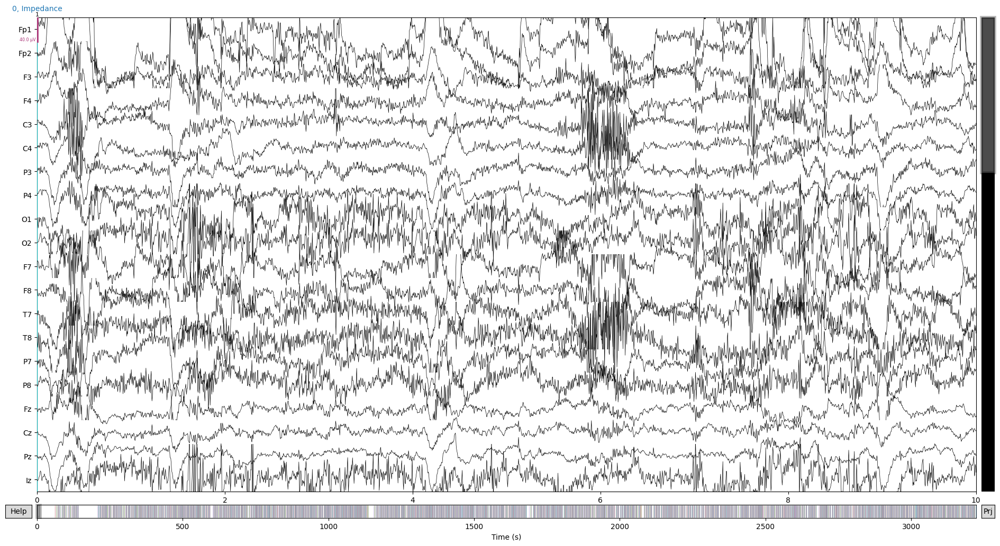

In [123]:
raw_filt.plot(events=events_all[0])

If there is a trigger near the Photodiode trigger, remove protodiode trigger

In [124]:
# Determine mean time diff btw photodiode peak and preceeding eeg trigger (excluding too long time distances)
time_dists_photo = []
long_dist = 50 #! arbitrary - check if it makes sense based on the data 

for i in range(len(events_all[0]) - 1):
    if events_all[0][i+1, 2] == 99:
        time_dist = events_all[0][i+1, 0] - events_all[0][i, 0]
        if time_dist < long_dist:
            time_dists_photo.append(time_dist)
            print(events_all[0][i+1, 0] - events_all[0][i, 0])

mean_time_diff_photo = np.mean(time_dists_photo)
print(mean_time_diff_photo)

15853
11
10
10
2090
11
10
10
10
11
11
10
11
11
11
11
11
11
10
10
11
10
11
10
11
11
10
10
10
11
11
11
10
10
10
10
10
10
11
11
10
10
11
10
10
11
10
11
11
11
11
10
10
11
10
11
10
10
11
11
10
10
11
10
11
10
11
10
11
11
11
11
11
11
10
10
10
11
10
11
11
11
11
11
10
10
10
11
11
11
10
10
10
11
10
10
11
11
11
11
1827
10
11
11
11
10
11
866
10
10
11
10
10
10
11
11
10
11
10
11
10
10
10
11
10
10
10
11
11
11
11
10
10
10
11
10
10
10
442
11
11
10
10
11
10
11
11
10
11
11
11
10
10
11
11
10
10
10
10
10
10
11
10
11
10
11
10
10
10
10
10
10
10
11
10
11
10
10
11
11
10
11
11
10
11
10
11
10
11
11
11
11
11
11
11
10
11
11
10
10
11
11
10
11
11
10
10
10
10
10
11
10
11
10
11
10
11
11
10
11
11
10
10
11
11
11
10
11
11
10
10
11
11
10
11
10
11
10
10
10
11
10
10
11
11
10
10
10
11
11
10
11
11
10
10
11
10
10
10
11
11
10
11
10
10
10
11
10
11
10
10
10
11
11
10
11
10
10
10
11
10
11
11
10
11
10
10
10
11
10
10
10
10
10
11
11
11
10
10
11
10
11
10
10
10
10
11
10
11
10
11
11
11
11
11
11
11
10
11
10
11
10
11
11
11
10
10
10
11
11
1

In [125]:
# Set a threshold that determines proximity (based on your sampling rate and expected event duration)

# Initialize an empty list to store the filtered events
rows_to_filt = []
step_from_mean = 5 # Check in with the data, if that's an appropriate step to use

# Loop through the events and keep only the start event of each pair
for i in range(len(events_all[0]) - 1):
            if events_all[0][i+1, 2] == 99:
                # Compare the current event to the next one
                if events_all[0][i+1, 0] - events_all[0][i, 0] <=  (mean_time_diff_photo + step_from_mean):
                    rows_to_filt.append(i+1)

# Convert the list back to a NumPy array
rows_to_filt

[5,
 9,
 11,
 19,
 21,
 25,
 27,
 32,
 34,
 38,
 40,
 45,
 49,
 51,
 56,
 58,
 63,
 65,
 70,
 72,
 78,
 80,
 84,
 86,
 91,
 93,
 98,
 100,
 105,
 107,
 112,
 114,
 119,
 123,
 125,
 130,
 134,
 136,
 141,
 143,
 148,
 150,
 155,
 157,
 162,
 164,
 169,
 171,
 176,
 180,
 184,
 186,
 191,
 193,
 198,
 200,
 205,
 207,
 212,
 214,
 219,
 221,
 226,
 228,
 232,
 236,
 238,
 243,
 245,
 250,
 252,
 257,
 259,
 264,
 266,
 271,
 273,
 278,
 280,
 285,
 287,
 292,
 294,
 299,
 301,
 306,
 308,
 313,
 315,
 320,
 324,
 326,
 331,
 333,
 338,
 340,
 345,
 347,
 353,
 358,
 360,
 365,
 367,
 371,
 377,
 379,
 384,
 386,
 391,
 393,
 398,
 402,
 404,
 409,
 411,
 416,
 418,
 423,
 425,
 430,
 432,
 437,
 439,
 444,
 446,
 451,
 453,
 458,
 460,
 465,
 467,
 472,
 474,
 479,
 485,
 487,
 492,
 494,
 499,
 501,
 506,
 508,
 513,
 517,
 519,
 524,
 526,
 531,
 533,
 538,
 540,
 545,
 547,
 553,
 555,
 560,
 562,
 567,
 569,
 574,
 578,
 580,
 585,
 587,
 592,
 594,
 599,
 601,
 606,
 608,
 613,
 61

In [126]:
events_all_filt = np.delete(events_all[0], rows_to_filt, axis=0)
events_all_filt

array([[      0,       0,       1],
       [  15853,       0,      99],
       [  30574,       0,       2],
       ...,
       [1608541,       0,       9],
       [1608699,       0,      14],
       [1611511,       0,       1]])

In [269]:
len(events_all[0])

3845

In [270]:
len(events_all_filt)

2762

In [127]:
# Create a final version of an events tuple with correct events and dict with reassigned values
# Step 1: Unpack the tuple
_, trig_dict = events_all

# Step 2: Create a new tuple with the new dictionary
events = (events_all_filt, trig_dict)
events

(array([[      0,       0,       1],
        [  15853,       0,      99],
        [  30574,       0,       2],
        ...,
        [1608541,       0,       9],
        [1608699,       0,      14],
        [1611511,       0,       1]]),
 {'0, Impedance': 1,
  '1': 2,
  '111': 3,
  '2': 4,
  '20': 5,
  '3': 6,
  '30': 7,
  '4': 8,
  '40': 9,
  '5': 10,
  '6': 11,
  '77': 12,
  '8': 13,
  '9': 14,
  '99': 99})

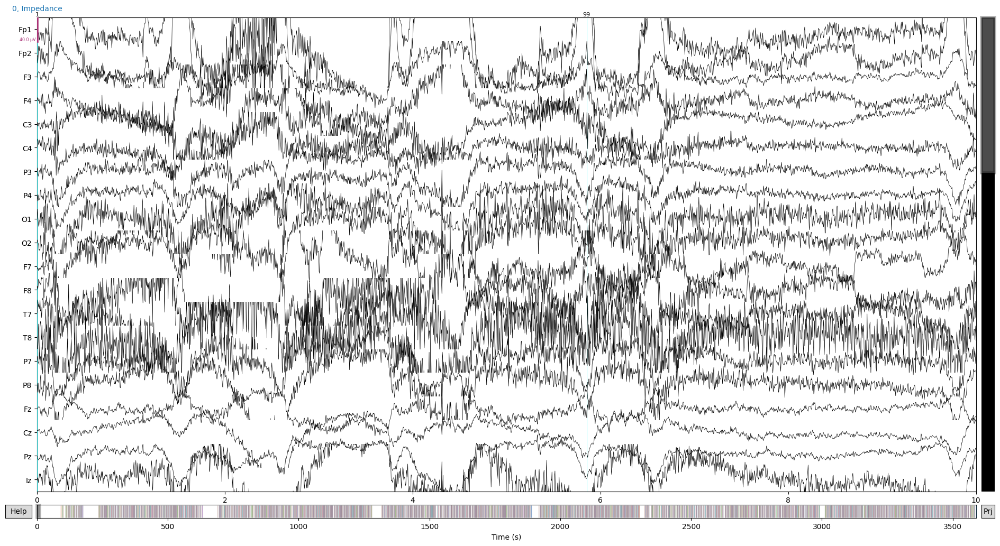

In [155]:
raw_filt.plot(events=events[0])

Reassign values to the triggers

In [ ]:
# This function assing names to the values (triggers) in EVENTS DICT corresponding to keys and replaces old trigger names with new ones in EVENTS ARRAY 
# INPUT: events tuple
# OUTPUT: tuple with renamed events
def rename_events_after_triggers(events: tuple) -> tuple:
    
    new_events = copy.deepcopy(events)
    
    # Assing events the values corresponding to the keys names
    for key, value in new_events[1].items():
        new_value = int(re.search(r'\d+', key).group())
        new_events[1][key] = new_value

    # Create a mapping from the old event values to the new event values
    value_mapping = {events[1][key]: new_events[1][key] for key in events[1] if key in new_events[1]}

    # Replace the values in the third column of the events array
    for old_value, new_value in value_mapping.items():
        new_events[0][:, 2][new_events[0][:, 2] == old_value] = new_value

    return new_events

In [ ]:
new_events = rename_events_after_triggers(events)

In [128]:
# Assing events the values corresponding to the keys names
new_events = copy.deepcopy(events)

for key, value in new_events[1].items():
    new_value = int(re.search(r'\d+', key).group())
    new_events[1][key] = new_value
new_events[1]


{'0, Impedance': 0,
 '1': 1,
 '111': 111,
 '2': 2,
 '20': 20,
 '3': 3,
 '30': 30,
 '4': 4,
 '40': 40,
 '5': 5,
 '6': 6,
 '77': 77,
 '8': 8,
 '9': 9,
 '99': 99}

In [129]:
# Create a mapping from the old event values to the new event values
value_mapping = {events[1][key]: new_events[1][key] for key in events[1] if key in new_events[1]}
value_mapping

{1: 0,
 2: 1,
 3: 111,
 4: 2,
 5: 20,
 6: 3,
 7: 30,
 8: 4,
 9: 40,
 10: 5,
 11: 6,
 12: 77,
 13: 8,
 14: 9,
 99: 99}

In [130]:
# Replace the values in the third column of the events array
for old_value, new_value in value_mapping.items():
    new_events[0][:, 2][new_events[0][:, 2] == old_value] = new_value

In [131]:
new_events

(array([[      0,       0,       0],
        [  15853,       0,      99],
        [  30574,       0,       1],
        ...,
        [1608541,       0,      40],
        [1608699,       0,       9],
        [1611511,       0,       0]]),
 {'0, Impedance': 0,
  '1': 1,
  '111': 111,
  '2': 2,
  '20': 20,
  '3': 3,
  '30': 30,
  '4': 4,
  '40': 40,
  '5': 5,
  '6': 6,
  '77': 77,
  '8': 8,
  '9': 9,
  '99': 99})

In [61]:
events

array([[      0,       0,       0],
       [   2926,       0,      99],
       [  45244,       0,       1],
       ...,
       [1791812,       0,      40],
       [1791970,       0,       9],
       [1794973,       0,       0]])

MAIN TASK - give keys in the dictionary meaningful names

1:	start of practice
2:	start of baseline
3:	start of first rotated block
4:	start of second rotated block
5:	start of post block
6:	start of first deadapt block
7:	start of second deadapt block

8:	trial start
9:	trial end

20:	target onset
30:	go signal onset
40:	reach end

111:	bad trial - moved in response to display of target
112:	bad trial - too slow 	%!!! CHANGED from 222
113:	bad trial - didnt react within 1s 	%!!! CHANGED from 333

In [132]:
# Assing keys the meaningful names
# First, create a dict with all possible triggers and their names
main_dict = {'0, Impedance': 0,
            'bad_early': 111,
            'bad_late': 77,
            'prac': 1,
            'baseline': 2,
            'target_on': 20,
            'adapt1': 3,
            'go_on': 30,
            'adapt2': 4,
            'reach_end': 40,
            'postadapt': 5,
            'deadapt1': 6,
            'deadapt2': 7,
            'trial_start': 8,
            'trial_end': 9,
            'photodiode': 99}

bad_triggers = {key: value for key, value in main_dict.items() if 'bad_' in key}
bad_triggers

{'bad_early': 111, 'bad_late': 77}

In [ ]:
# This function assings meaningful names to the keys in EVENTS DICT
# INPUT: events tuple
# OUTPUT: tuple with new EVENTS DICT keys

def make_sense(events: tuple, names_dict: dict) -> tuple:
    
    # Create an inverse mapping of main_dict
    inverse_main_dict = {v: k for k, v in main_dict.items()}

    # Replace keys in new_events with corresponding keys from main_dict
    replaced_keys_dict = {}
    for old_key, value in events[1].items():
        # Look up the corresponding new key using the value
        new_key = inverse_main_dict.get(value, old_key)  # Default to old_key if value not found in main_dict
        replaced_keys_dict[new_key] = value

    # Create a new tuple with the new dictionary
    new_events = (events[0], replaced_keys_dict)
    
    return new_events


In [ ]:
new_events = make_sense(new_events, main_dict)

In [133]:
# Then, create an inverse mapping of main_dict
inverse_main_dict = {v: k for k, v in main_dict.items()}

# Replace keys in new_events with corresponding keys from main_dict
replaced_keys_dict = {}
for old_key, value in new_events[1].items():
    # Look up the corresponding new key using the value
    new_key = inverse_main_dict.get(value, old_key)  # Default to old_key if value not found in main_dict
    replaced_keys_dict[new_key] = value

# Output the resulting dictionary
print(replaced_keys_dict)

{'0, Impedance': 0, 'prac': 1, 'bad_early': 111, 'baseline': 2, 'target_on': 20, 'adapt1': 3, 'go_on': 30, 'adapt2': 4, 'reach_end': 40, 'postadapt': 5, 'deadapt1': 6, 'bad_late': 77, 'trial_start': 8, 'trial_end': 9, 'photodiode': 99}


In [134]:
# Create a final version of an events tuple with correct events and dict with reassigned values
# Step 1: Unpack the tuple
other_element, _ = new_events

# Step 2: Create a new tuple with the new dictionary
new_events = (other_element, replaced_keys_dict)
new_events

(array([[      0,       0,       0],
        [  15853,       0,      99],
        [  30574,       0,       1],
        ...,
        [1608541,       0,      40],
        [1608699,       0,       9],
        [1611511,       0,       0]]),
 {'0, Impedance': 0,
  'prac': 1,
  'bad_early': 111,
  'baseline': 2,
  'target_on': 20,
  'adapt1': 3,
  'go_on': 30,
  'adapt2': 4,
  'reach_end': 40,
  'postadapt': 5,
  'deadapt1': 6,
  'bad_late': 77,
  'trial_start': 8,
  'trial_end': 9,
  'photodiode': 99})

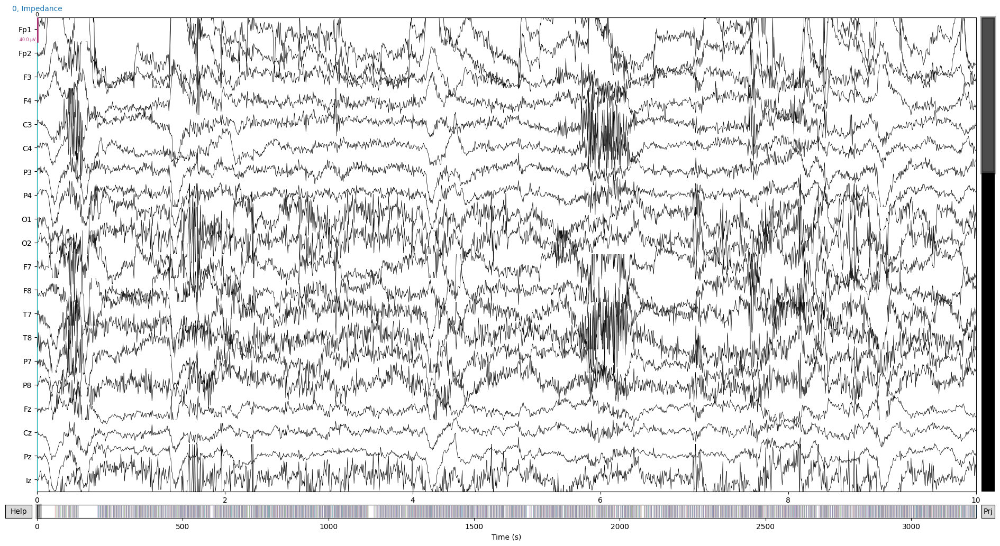

In [135]:
raw_filt.plot(events=new_events[0])

Add missing end of trial events

In [ ]:
# This function adds end of trial events (9) to BAD trials (111 & 77)
# INPUT: events tuple
# OUTPUT: updated events array

def add_end_to_bad(events: tuple, bad_triggers=[None]) -> np.array:
    
    # SANITY CHECK: min_time should not exceed 10 (see the following cell)
    time_dists = []

    for i in range(len(new_events[0][:-1, 0])):
        time_dist = new_events[0][i+1, 0] - new_events[0][i, 0]
        time_dists.append(time_dist)

    min_time = min(time_dists)
    print(min_time)

    if min_time <= 10:
        raise ValueError('Min_time exceeds 10 - adjust the timing for new events!')

    add_events = []

    # Loop through events, find 111 triggers, and add trigger 9
    for event in events[0]:
        if event[2] in bad_triggers.values():  # 111, 112, 113 trigger code
            # Add min distance between 111 and new 9
            add_event_time = event[0] + 10

            # Create a new event with the trigger code 9
            add_event = [add_event_time, 0, events[1]['trial_end']]  # [time, 0, trigger code 9]

            # Append the new event to the list of new events
            add_events.append(add_event)

    # Convert add_events list to a NumPy array
    add_events = np.array(add_events, dtype=int)

    # Combine the original events with the new events
    events_array = np.vstack((events[0], add_events))

    # Sort the modified events by the time column (first column)
    events_array = events_array[np.argsort(events_array[:, 0])]

    return events_array

In [ ]:
new_events_array = add_end_to_bad(new_events, bad_triggers)

In [136]:
# SANITY CHECK: min_time should not exceed 10 (see the following cell)
time_dists = []

for i in range(len(new_events[0][:-1, 0])):
    time_dist = new_events[0][i+1, 0] - new_events[0][i, 0]
    time_dists.append(time_dist)

min_time = min(time_dists)
print(min_time)

if min_time <= 10:
    raise ValueError('Min_time exceeds 10 - adjust the timing for new events!')

16


In [137]:
# Extract events array and event dictionary from the tuple
events = new_events[0]
event_id = new_events[1]

# Create a copy of the events array to modify
modified_events = events.copy()
upd_events = []

# Loop through events, find 111 triggers, and add trigger 9
for event in events:
    if event[2] in bad_triggers.values():  # 111, 112, 113 trigger code
        # Add min distance between 111 and new 9
        new_event_time = event[0] + 10

        # Create a new event with the trigger code 9
        new_event = [new_event_time, 0, event_id['trial_end']]  # [time, 0, trigger code 9]

        # Append the new event to the list of new events
        upd_events.append(new_event)
        # Append the new event to the modified_events array
        # modified_events = np.vstack((modified_events, new_event))

# Convert new_events list to a NumPy array
upd_events = np.array(upd_events, dtype=int)

# Combine the original events with the new events
modified_events = np.vstack((modified_events, upd_events))

# Sort the modified events by the time column (first column)
modified_events = modified_events[np.argsort(modified_events[:, 0])]

# Now modified_events_sorted includes both original and new events with trigger 9 after 111 events
print(modified_events[:50])

[[    0     0     0]
 [15853     0    99]
 [30574     0     1]
 [30827     0     8]
 [33659     0    20]
 [33951     0   111]
 [33961     0     9]
 [35051     0     8]
 [36426     0    20]
 [37076     0    30]
 [37467     0    40]
 [37638     0     9]
 [37738     0     8]
 [39828     0    99]
 [40076     0   111]
 [40086     0     9]
 [41176     0     8]
 [43142     0    20]
 [43376     0    30]
 [43717     0    40]
 [43876     0     9]
 [45493     0    20]
 [46201     0    30]
 [46409     0    40]
 [46568     0     9]
 [46668     0     8]
 [47809     0    20]
 [48359     0    30]
 [49942     0    77]
 [49952     0     9]
 [51043     0     8]
 [53118     0    20]
 [53984     0    30]
 [55259     0    40]
 [55418     0     9]
 [55518     0     8]
 [57359     0    20]
 [57567     0   111]
 [57577     0     9]
 [58668     0     8]
 [60392     0    20]
 [61142     0    30]
 [61318     0    40]
 [61477     0     9]
 [61577     0     8]
 [63717     0    20]
 [64092     0    30]
 [64317     0

In [34]:
len(new_events[0])

2762

In [33]:
len(modified_events)

2819

In [32]:
len(upd_events)

57

Introduce start (8) and end (9) of trial triggers if there are none

In [ ]:
# This function adds start (8) and end (9) of trial events, if they are missing
# INPUT: events array
# OUTPUT: updated events array

def add_start_and_end(events_array: np.array) -> np.array:

    #!!! modified_events -> new_events_array !!!

    ####### Check mean time distance between start (8) and end (9) of trial events #######
    # SANITY CHECK: if mean significantly deviates from 100 - check the data
    to_avg = []
    for i in range(len(events_array) - 1):
        if events_array[i, 2] == 9:
            if events_array[i+1, 2] == 8:
                if events_array[i+1, 0] - events_array[i, 0] < 1000:
                    to_avg.append(events_array[i+1, 0] - events_array[i, 0])

    print('Mean:', np.mean(to_avg))

    if int(np.mean(to_avg)) not in range(90,110):
        raise ValueError('Mean deviates from 100 - check the data!')
    ###########################################################################


    ####### Add missing start (8) and end (9) of trial events #######
    upd_events = []
    for i in range(len(events_array) - 1):

        # if there's no start
        if events_array[i, 2] == 9:
            if events_array[i+1, 2] not in range(9):
                print(i,'- no start')
                
                # Add mean timing btw end (9) and start (8)
                new_event_time = events_array[i, 0] + int(np.mean(to_avg))

                # Create a new event with the trigger code 8
                new_event = [new_event_time, 0, event_id['trial_start']]  # [time, 0, trigger code 8]

                # Append the new event to the events_array array
                upd_events.append(new_event)
                print(new_event)
        
        # if there's no end
        elif events_array[i+1, 2] == 8:
            if events_array[i, 2] not in range(1,10):
                print(i,'- no end')
                
                # Add mean timing btw end (9) and start (8)
                new_event_time = events_array[i+1, 0] - int(np.mean(to_avg))

                # Create a new event with the trigger code 8
                new_event = [new_event_time, 0, event_id['trial_end']]  # [time, 0, trigger code 9]

                # Append the new event to the events_array array
                upd_events.append(new_event)
                print(new_event)

    # Convert new_events list to a NumPy array
    upd_events = np.array(upd_events, dtype=int)

    # Combine the original events with the new events
    events_array = np.vstack((events_array, upd_events))

    # Sort the modified events by the time column (first column)
    events_array = events_array[np.argsort(events_array[:, 0])]
                
    return events_array

In [ ]:
upd_events_array = add_start_and_end(new_events_array)

In [ ]:
# This function counts number of events and checks if they match
# INPUT: events array
# OUTPUT: None or ValueError if events counts don't match

def check_events_counts(events_array: np.array) -> None:

    # Convert the column with trigger names to a pandas Series and get value counts
    value_counts = pd.Series(events_array[:,2]).value_counts()

    # Get counts for specific numbers (if they exist, otherwise return 0)
    count_8 = value_counts.get(8, 0) # start of trial
    count_9 = value_counts.get(9, 0) # end of trial
    count_111 = value_counts.get(111, 0) #
    count_77 = value_counts.get(77, 0)

    # Check if num of 8 equals num of 9
    if count_8 != count_9:
        raise ValueError(f"Count of 8 = {count_8} does not equal count of 9 = {count_9} !")

    print(f'Total number of trials: {count_8}')

    # Check if num of 111 + num of 77 equals num of 8
    if count_8 - count_111 + count_77 != 520:
        raise ValueError(f"Count of 8 - 111 + count of 77 = {count_8 - count_111 + count_77} does not equal 520 !")

    print("ALL GOOD: Events counts match!")


In [ ]:
# Check if number of events match
try:
    check_events_counts(upd_events_array)
except ValueError as e:
    print(f"Error: {e}")

In [138]:
#!!! modified_events -> new_events_array !!!

# SANITY CHECK: if mean significantly deviates from 100 - check the data
to_avg = []
for i in range(len(modified_events) - 1):
    if modified_events[i, 2] == 9:
        if modified_events[i+1, 2] == 8:
            print(modified_events[i+1, 0] - modified_events[i, 0])
            if modified_events[i+1, 0] - modified_events[i, 0] < 1000:
                to_avg.append(modified_events[i+1, 0] - modified_events[i, 0])

print('Mean:', np.mean(to_avg))

if int(np.mean(to_avg)) not in range(90,110):
    raise ValueError('Mean deviates from 100 - check the data!')

1090
100
1090
100
1091
100
1091
100
100
100
100
100
100
99
100
1090
101
1090
100
100
100
100
100
101
1090
1091
100
100
100
100
100
100
1090
100
100
101
100
100
100
100
100
101
100
100
100
1090
100
101
100
99
101
100
101
101
101
100
100
1090
100
100
100
101
100
100
100
100
100
100
100
101
100
100
100
100
1090
100
100
100
100
101
101
100
1090
100
100
100
100
100
100
100
101
99
100
100
100
100
101
100
100
100
1090
1091
100
100
100
100
100
101
100
100
1090
100
100
100
100
100
1090
100
100
100
100
100
100
100
101
1090
100
100
100
100
100
100
100
100
100
100
100
99
99
100
100
100
100
100
100
100
1090
100
100
100
101
100
100
100
100
101
100
100
101
100
101
100
100
101
100
100
101
100
101
100
100
100
100
101
100
100
100
100
100
101
100
1090
100
100
100
100
101
101
101
101
101
101
100
101
100
100
100
100
100
100
1090
100
100
100
100
101
101
101
100
101
100
100
100
100
100
100
101
101
100
100
100
99
100
100
100
100
101
101
101
100
100
101
100
99
100
100
100
101
100
101
100
101
100
101
99
100
100

In [139]:
events_final = modified_events.copy()
upd_events = []

for i in range(len(events_final) - 1):

    # if there's no start
    if events_final[i, 2] == 9:
        if events_final[i+1, 2] not in range(9):
            print(i,'- no start')
            
            # Add mean timing btw end (9) and start (8)
            new_event_time = modified_events[i, 0] + int(np.mean(to_avg))

            # Create a new event with the trigger code 8
            new_event = [new_event_time, 0, event_id['trial_start']]  # [time, 0, trigger code 8]

            # Append the new event to the modified_events array
            upd_events.append(new_event)
            print(new_event)
    
    # if there's no end
    elif events_final[i+1, 2] == 8:
        if events_final[i, 2] not in range(1,10):
            print(i,'- no end')
            
            # Add mean timing btw end (9) and start (8)
            new_event_time = modified_events[i+1, 0] - int(np.mean(to_avg))

            # Create a new event with the trigger code 8
            new_event = [new_event_time, 0, event_id['trial_end']]  # [time, 0, trigger code 9]

            # Append the new event to the modified_events array
            upd_events.append(new_event)
            print(new_event)

# Convert new_events list to a NumPy array
upd_events = np.array(upd_events, dtype=int)

# Combine the original events with the new events
events_final = np.vstack((events_final, upd_events))

# Sort the modified events by the time column (first column)
events_final = events_final[np.argsort(events_final[:, 0])]
            
events_final


20 - no start
[43976, 0, 8]
63 - no end
[105726, 0, 9]
174 - no start
[170709, 0, 8]
1198 - no end
[728250, 0, 9]
1288 - no start
[773850, 0, 8]
1316 - no end
[790658, 0, 9]
1488 - no end
[891142, 0, 9]
1513 - no start
[904950, 0, 8]
1557 - no start
[928017, 0, 8]
1681 - no end
[1001542, 0, 9]
1896 - no start
[1134050, 0, 8]
2213 - no start
[1316433, 0, 8]
2387 - no end
[1423341, 0, 9]
2411 - no end
[1435441, 0, 9]
2541 - no start
[1506441, 0, 8]


array([[      0,       0,       0],
       [  15853,       0,      99],
       [  30574,       0,       1],
       ...,
       [1608541,       0,      40],
       [1608699,       0,       9],
       [1611511,       0,       0]])

In [37]:
len(upd_events)

17

In [38]:
len(events_final)

2836

In [39]:
len(modified_events)

2819

In [140]:
for i in range(len(events_final)):
    print(events_final[i])

[0 0 0]
[15853     0    99]
[30574     0     1]
[30827     0     8]
[33659     0    20]
[33951     0   111]
[33961     0     9]
[35051     0     8]
[36426     0    20]
[37076     0    30]
[37467     0    40]
[37638     0     9]
[37738     0     8]
[39828     0    99]
[40076     0   111]
[40086     0     9]
[41176     0     8]
[43142     0    20]
[43376     0    30]
[43717     0    40]
[43876     0     9]
[43976     0     8]
[45493     0    20]
[46201     0    30]
[46409     0    40]
[46568     0     9]
[46668     0     8]
[47809     0    20]
[48359     0    30]
[49942     0    77]
[49952     0     9]
[51043     0     8]
[53118     0    20]
[53984     0    30]
[55259     0    40]
[55418     0     9]
[55518     0     8]
[57359     0    20]
[57567     0   111]
[57577     0     9]
[58668     0     8]
[60392     0    20]
[61142     0    30]
[61318     0    40]
[61477     0     9]
[61577     0     8]
[63717     0    20]
[64092     0    30]
[64317     0    40]
[64476     0     9]
[64576     0

In [141]:
# SANITY CHECK: number of events 8 = 9 AND 8 - (111 + 77) = 520
s = pd.Series(events_final[:,2])
s.value_counts()

8      559
9      559
20     550
30     516
40     508
111     38
99      15
0        2
1        1
77       1
2        1
3        1
4        1
5        1
6        1
Name: count, dtype: int64

________________________

Rename the 99 triggers to 20 or 30

In [ ]:
# This function converts photodiode events (99) to either target_on (20) or go signal (30)
# INPUT: events array
# OUTPUT: None or ValueError if events counts don't match

def get_target_and_go_from_photo(events_array: np.array, events_ids: dict) -> tuple:

    # Initialize an empty list to store the filtered events
    rows_to_filt = []

    # replace 99 with 20 and 30 and filter 99 triggerch that do not match the pattern
    for i in range(len(events_array) - 1):

        if events_array[i, 2] == 99:
            if events_array[i-1, 2] == 8:
                if events_array[i+1, 2] == 30 or events_array[i+1, 2] == 99:
                    events_array[i, 2] = 20
            elif events_array[i-1, 2] == 20 and events_array[i+1, 2] == 40:
                events_array[i, 2] = 30
            else:
                rows_to_filt.append(i)

    # delete 99 rows from events array and 'photodiode' value from events dict
    events_array_filt = np.delete(events_array, rows_to_filt, axis=0)
    events_ids.pop("photodiode")

    # save final version of events tuple
    events_final_to_save = (events_array_filt, event_id)
    
    return events_final_to_save

In [ ]:
events_final_to_save = get_target_and_go_from_photo(upd_events_array, new_events[1])

# Save tuple as a pickle file
with open(os.path.join(filt_dir, f'{sub_name}{task}_events.pkl'), 'wb') as pickle_file:
    pickle.dump(events_final_to_save, pickle_file)

print(f"{sub_name}: Events SAVED successfully!")

In [142]:
# Initialize an empty list to store the filtered events
rows_to_filt = []

for i in range(len(events_final) - 1):

    if events_final[i, 2] == 99:
        if events_final[i-1, 2] == 8:
            if events_final[i+1, 2] == 30 or events_final[i+1, 2] == 99:
                events_final[i, 2] = 20
        elif events_final[i-1, 2] == 20 and events_final[i+1, 2] == 40:
            events_final[i, 2] = 30
        else:
            rows_to_filt.append(i)

events_final_filt = np.delete(events_final, rows_to_filt, axis=0)

In [44]:
rows_to_filt

[1]

In [143]:
for i in range(len(events_final_filt)):
    print(events_final_filt[i])

[0 0 0]
[30574     0     1]
[30827     0     8]
[33659     0    20]
[33951     0   111]
[33961     0     9]
[35051     0     8]
[36426     0    20]
[37076     0    30]
[37467     0    40]
[37638     0     9]
[37738     0     8]
[39828     0    99]
[40076     0   111]
[40086     0     9]
[41176     0     8]
[43142     0    20]
[43376     0    30]
[43717     0    40]
[43876     0     9]
[43976     0     8]
[45493     0    20]
[46201     0    30]
[46409     0    40]
[46568     0     9]
[46668     0     8]
[47809     0    20]
[48359     0    30]
[49942     0    77]
[49952     0     9]
[51043     0     8]
[53118     0    20]
[53984     0    30]
[55259     0    40]
[55418     0     9]
[55518     0     8]
[57359     0    20]
[57567     0   111]
[57577     0     9]
[58668     0     8]
[60392     0    20]
[61142     0    30]
[61318     0    40]
[61477     0     9]
[61577     0     8]
[63717     0    20]
[64092     0    30]
[64317     0    40]
[64476     0     9]
[64576     0     8]
[66168     0

In [147]:
event_id.pop("photodiode")
events_final_to_save = (events_final_filt, event_id)

In [148]:
events_final_to_save

(array([[      0,       0,       0],
        [  30574,       0,       1],
        [  30827,       0,       8],
        ...,
        [1608541,       0,      40],
        [1608699,       0,       9],
        [1611511,       0,       0]]),
 {'0, Impedance': 0,
  'prac': 1,
  'bad_early': 111,
  'baseline': 2,
  'target_on': 20,
  'adapt1': 3,
  'go_on': 30,
  'adapt2': 4,
  'reach_end': 40,
  'postadapt': 5,
  'deadapt1': 6,
  'bad_late': 77,
  'trial_start': 8,
  'trial_end': 9})

In [149]:
# Save tuple as a pickle file
with open(os.path.join(filt_dir, f'{sub_name}{task}_events.pkl'), 'wb') as pickle_file:
    pickle.dump(events_final_to_save, pickle_file)

print("Events SAVED.")


Events SAVED.


In [151]:
# SANITY CHECK: Open events from pickle file
with open(os.path.join(filt_dir, f'{sub_name}{task}_events.pkl'), 'rb') as pickle_file:
    events_final_to_save1 = pickle.load(pickle_file)

events_final_to_save1

(array([[      0,       0,       0],
        [  30574,       0,       1],
        [  30827,       0,       8],
        ...,
        [1608541,       0,      40],
        [1608699,       0,       9],
        [1611511,       0,       0]]),
 {'0, Impedance': 0,
  'prac': 1,
  'bad_early': 111,
  'baseline': 2,
  'target_on': 20,
  'adapt1': 3,
  'go_on': 30,
  'adapt2': 4,
  'reach_end': 40,
  'postadapt': 5,
  'deadapt1': 6,
  'bad_late': 77,
  'trial_start': 8,
  'trial_end': 9})

Marking the trials that do not contain [8 20 30 40 9] pattern as BAD

In [ ]:
# This function annotates trials that do not match the pattern [8, 20, 30, 40, 9]
# INPUT: raw_filt fif file, events array
# OUTPUT: annotated raw_filt fif file

def annotate_bad_trials(raw_filt: mne.io.fiff.raw.Raw, events_array: np.array) -> mne.io.fiff.raw.Raw:

    # The correct trigger sequence for a normal trial
    correct_sequence = [8, 20, 30, 40, 9]

    # Get the sampling frequency from the raw EEG data
    sfreq = raw_filt.info['sfreq']

    # Find indices of all trial starts (trigger 8)
    trial_start_indices = np.where(events_array[:, 2] == 8)[0]

    # List to store annotations for bad segments
    bad_segs = []

    # Iterate through each trial start index
    for start_idx in trial_start_indices:
        # Find the index of the corresponding '9' trigger (trial_end)
        trial_end_idx = np.where(events_array[start_idx:, 2] == 9)[0]
        
        if len(trial_end_idx) > 0:  # Make sure '9' trigger exists after '8'
            trial_end_idx = trial_end_idx[0] + start_idx  # Adjust relative to start_idx
            
            # Extract the potential trigger sequence starting from this trial start
            trigger_sequence = events_array[start_idx:trial_end_idx+1, 2]  # Include '9' in the sequence
            
            # Check if the extracted sequence matches the correct sequence
            if not np.array_equal(trigger_sequence, correct_sequence):
                # Mark this segment as bad from trigger 8 to trigger 9
                start_time = events_array[start_idx, 0] / sfreq  # Convert sample point to time (in seconds)
                end_time = events_array[trial_end_idx, 0] / sfreq  # Time of trigger 9
                
                # Append the bad segment as an annotation
                bad_segs.append((start_time, end_time - start_time, 'bad'))

    # Add an annotation for everything before the first trigger '2' (baseline)
    baseline_idx = np.where(events_array[:, 2] == 2)[0]  # Find the index of trigger 2
    if len(baseline_idx) > 0:
        first_baseline_idx = baseline_idx[0]
        first_baseline_time = events_array[first_baseline_idx, 0] / sfreq  # Time of the first trigger 2
        
        # Mark from the start of the recording (time 0) to the time of the first trigger 2
        bad_segs.append((0, first_baseline_time, 'bad'))
    else:
        ValueError(f'{sub_name}: No trigger for Baseline block!')

    # Convert bad_segs list to MNE's Annotations format
    onsets, durations, descriptions = zip(*bad_segs)
    bad_annotations = mne.Annotations(onset=onsets, duration=durations, description=descriptions)

    # Add the new annotations to the raw data
    raw_filt.set_annotations(bad_annotations)

    return raw_filt

In [ ]:
raw_filt = annotate_bad_trials(raw_filt, events_final_to_save[0])

# Now the raw data contains annotations for bad segments
raw_filt.plot(events=events_final_to_save[0])

# save filtered file
raw_filt.save(os.path.join(filt_dir, f'{sub_name}{task}_filt_events.fif'), overwrite=True)

print(f'{sub_name}: Processing finished successfully - triggers recovered and bad trials marked!')

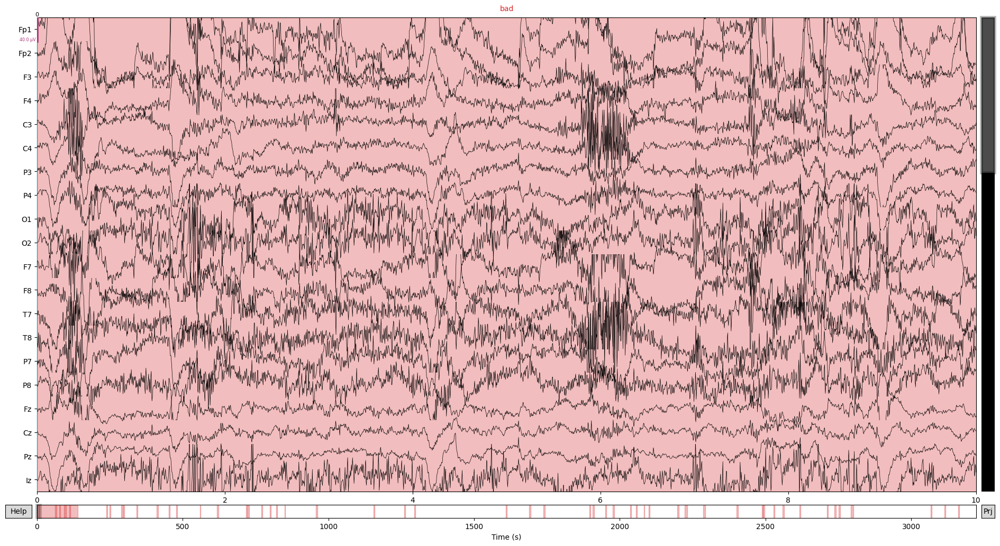

In [152]:
# The correct trigger sequence for a normal trial
correct_sequence = [8, 20, 30, 40, 9]

# Get the sampling frequency from the raw EEG data
sfreq = raw_filt.info['sfreq']

# Find indices of all trial starts (trigger 8)
trial_start_indices = np.where(events_final_filt[:, 2] == 8)[0]

# List to store annotations for bad segments
bad_segs = []

# Iterate through each trial start index
for start_idx in trial_start_indices:
    # Find the index of the corresponding '9' trigger (trial_end)
    trial_end_idx = np.where(events_final_filt[start_idx:, 2] == 9)[0]
    
    if len(trial_end_idx) > 0:  # Make sure '9' trigger exists after '8'
        trial_end_idx = trial_end_idx[0] + start_idx  # Adjust relative to start_idx
        
        # Extract the potential trigger sequence starting from this trial start
        trigger_sequence = events_final_filt[start_idx:trial_end_idx+1, 2]  # Include '9' in the sequence
        
        # Check if the extracted sequence matches the correct sequence
        if not np.array_equal(trigger_sequence, correct_sequence):
            # Mark this segment as bad from trigger 8 to trigger 9
            start_time = events_final_filt[start_idx, 0] / sfreq  # Convert sample point to time (in seconds)
            end_time = events_final_filt[trial_end_idx, 0] / sfreq  # Time of trigger 9
            
            # Append the bad segment as an annotation
            bad_segs.append((start_time, end_time - start_time, 'bad'))

# Add an annotation for everything before the first trigger '2' (baseline)
baseline_idx = np.where(events[:, 2] == 2)[0]  # Find the index of trigger 2
if len(baseline_idx) > 0:
    first_baseline_idx = baseline_idx[0]
    first_baseline_time = events[first_baseline_idx, 0] / sfreq  # Time of the first trigger 2
    
    # Mark from the start of the recording (time 0) to the time of the first trigger 2
    bad_segs.append((0, first_baseline_time, 'bad'))
else:
    ValueError(f'{sub_name}: No trigger for Baseline block!')

# Convert bad_segs list to MNE's Annotations format
onsets, durations, descriptions = zip(*bad_segs)
bad_annotations = mne.Annotations(onset=onsets, duration=durations, description=descriptions)

# Add the new annotations to the raw data
raw_filt.set_annotations(bad_annotations)


In [ ]:
# Now the raw data contains annotations for bad segments
raw_filt.plot(events=events_final_filt)

In [ ]:
# save filtered file
raw_filt.save(os.path.join(filt_dir, f'{sub_name}{task}_filt_events.fif'), overwrite=True)

In [ ]:
print(f'{sub_name}: Processing finished successfully - triggers recovered and bad trials marked!')

______________

STOP HERE

**CREATE EPOCHS**

In [74]:
events_final_filt[1]

{'0, Impedance': 0,
 'prac': 1,
 'bad_early': 111,
 'baseline': 2,
 'target_on': 20,
 'adapt1': 3,
 'go_on': 30,
 'adapt2': 4,
 'reach_end': 40,
 'postadapt': 5,
 'deadapt1': 6,
 'deadapt2': 7,
 'bad_late': 77,
 'trial_start': 8,
 'trial_end': 9,
 'protodiode': 99}

In [ ]:
# CHECK !!!
# DON'T LAUNCH

# epochs = mne.Epochs(raw_filt, events=events_final_filt[0], event_id=events_final_filt[1], tmin=-0.2, tmax=1.0, preload=True)

# # Save the epochs to a file (with modified events)
# epochs.save('path_to_save/subject_epochs_with_modified_events-epo.fif', overwrite=True)